In [1]:
import argparse
from pathlib import Path
import pytorch_lightning as pl
from pytorch_lightning.loggers import TensorBoardLogger
from torch.utils.data import DataLoader, random_split
import config
from dataset import FaceLandmarksDataset, get_files
from model import FaceAlignmentModel

import numpy as np
import cv2
import torch
from torch.utils.data import Dataset
import dlib
import albumentations as A
import config

def read_pts(file_path):
    with open(file_path, 'r') as f:
        lines = f.readlines()
    
    landmarks = []

    for line in lines[3:-1]:
        x, y = map(float, line.strip().split())
        landmarks.append([x, y])
    
    return np.array(landmarks)

def get_files(root_folder):
    files = []
    for folder in root_folder:
        for ext in ["*.jpg", "*.png"]:
            for img_path in folder.glob(ext):
                pts_path = img_path.with_suffix(".pts")
                if pts_path.exists() and len(read_pts(pts_path)) == 68:
                    files.append((img_path, pts_path))
    return files  

class FaceLandmarksDataset(Dataset):
    def __init__(self, files, train=True):
        self.samples = []
        self.transform = get_transforms(train)
        self.samples = files            
        self.detector = dlib.get_frontal_face_detector()

    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        img_path, pts_path = self.samples[idx]
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        rect = self._get_face_rect(image)
        x1, y1, x2, y2 = rect.left(), rect.top(), rect.right(), rect.bottom()

        landmarks = read_pts(str(pts_path))

        landmarks_x_max = landmarks[:, 0].max()
        landmarks_y_max = landmarks[:, 1].max()

        landmarks_x_min = landmarks[:, 0].min()
        landmarks_y_min = landmarks[:, 1].min()

        x1_face_rectangle = int(min(x1, landmarks_x_min))
        x2_face_rectangle = int(max(x2, landmarks_x_max))
        y1_face_rectangle = int(min(y1, landmarks_y_min))
        y2_face_rectangle = int(max(y2, landmarks_y_max))

        x1_expanded = max(0, x1_face_rectangle - config.CROP_EXPANSION)
        y1_expanded = max(0, y1_face_rectangle - config.CROP_EXPANSION)
        x2_expanded = min(image.shape[1], x2_face_rectangle + config.CROP_EXPANSION)
        y2_expanded = min(image.shape[0], y2_face_rectangle + config.CROP_EXPANSION)

        face_crop = image[y1_expanded:y2_expanded, x1_expanded:x2_expanded]

        landmarks = landmarks - np.array([x1_expanded, y1_expanded])

        transformed = self.transform(image=face_crop)
        transformed_image = transformed['image']

        scale_x = (x2_expanded - x1_expanded) / config.IMAGE_SIZE[0]
        scale_y = (y2_expanded - y1_expanded) / config.IMAGE_SIZE[1]

        scale = torch.tensor([scale_x, scale_y], dtype=torch.float32)

        transformed_landmarks = torch.tensor(landmarks) / scale
        
        sample = {
            "image": torch.tensor(transformed_image, dtype=torch.float32).permute(2, 0, 1),
            "landmarks": transformed_landmarks,
            "face_rect": torch.tensor([x1, y1, x2, y2], dtype=torch.float32),
            "scale": scale,
            "image_path": img_path
        }
        return sample
    
    def _get_face_rect(self, image):
        faces = self.detector(image)
        if len(faces) == 0:
            h, w = image.shape[:2]
            return dlib.rectangle(0, 0, w, h)
        return faces[0]

def get_transforms(train=True):
    if train:
        return A.Compose([
            A.Resize(config.IMAGE_SIZE[0], config.IMAGE_SIZE[1]),
            A.RandomBrightnessContrast(p=0.2),
            A.GaussianBlur(p=0.1),
            A.ToGray(p=0.05),
            A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
    else:
        return A.Compose([
            A.Resize(config.IMAGE_SIZE[0], config.IMAGE_SIZE[1]),
            A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

d:\face_detection_test\venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
import matplotlib.pyplot as plt

files = get_files(config.TRAIN_FOLDERS)
train_size = int(len(files) * config.TRAIN_VAL_SPLIT)
train_files, val_files = random_split(files, [train_size, len(files) - train_size])
train_dataset = FaceLandmarksDataset(train_files, train=True)
val_dataset = FaceLandmarksDataset(val_files, train=False)

train_loader = DataLoader(train_dataset, batch_size=config.BATCH_SIZE, shuffle=True, num_workers=config.NUM_WORKERS)
val_loader = DataLoader(val_dataset, batch_size=config.BATCH_SIZE, shuffle=False, num_workers=config.NUM_WORKERS)

for i in range(10, 30):
    sample = train_dataset[i]
    image = sample['image'].permute(1, 2, 0).numpy()
    landmarks = sample['landmarks'].numpy()
    plt.imshow(image)
    plt.scatter(landmarks[:, 0], landmarks[:, 1], s=20, c='red', marker='o')
    plt.show()

In [2]:
import numpy as np
import torch

def evaluate_model(model, loader):
    predictions = []
    gt = []
    normalizations = []
    img_paths = []
    model.eval()
    with torch.no_grad():
        for batch in loader:
            images = batch["image"].to('cuda')
            landmarks = batch["landmarks"]
            scale = batch["scale"]
            preds = model(images)
            for i in range(preds.shape[0]):
                face_rect = batch["face_rect"][i].cpu().numpy()
                scale_i = scale[i].cpu().numpy()
                pred_points = preds[i].cpu().numpy() * scale_i
                pred_points = pred_points + np.array([face_rect[0], face_rect[1]])
                true_points = landmarks[i].cpu().numpy() * scale_i
                true_points = true_points + np.array([face_rect[0], face_rect[1]])
                H = face_rect[3] - face_rect[1]
                W = face_rect[2] - face_rect[0]
                norm_factor = np.sqrt(H * W)
                predictions.append(pred_points)
                gt.append(true_points)
                normalizations.append(norm_factor)
                img_paths.append(batch['image_path'][i])

    return np.array(predictions), np.array(gt), np.array(normalizations), np.array(img_paths)

def read_pts(file_path):
    with open(file_path, 'r') as f:
        lines = f.readlines()
    
    landmarks = []

    for line in lines[3:-1]:
        x, y = map(float, line.strip().split())
        landmarks.append([x, y])
    
    return np.array(landmarks)

import os
jpg_files = [os.path.join('data', '300W', 'test', i) for i in os.listdir('data/300W/test') if i.endswith('.jpg')]
pts_files = [os.path.join('data', '300W', 'test', i) for i in os.listdir('data/300W/test') if i.endswith('.pts')]

In [3]:
files = [(i, j) for i, j in zip(jpg_files, pts_files)][:18]

dataset = FaceLandmarksDataset(files, train=True)
loader = DataLoader(dataset, batch_size=config.BATCH_SIZE, shuffle=False)

model = FaceAlignmentModel.load_from_checkpoint('outputs/checkpoints/efficientnet_mse.ckpt', map_location=torch.device('cuda'))
preds, gt, normalizations, img_paths = evaluate_model(model, loader)

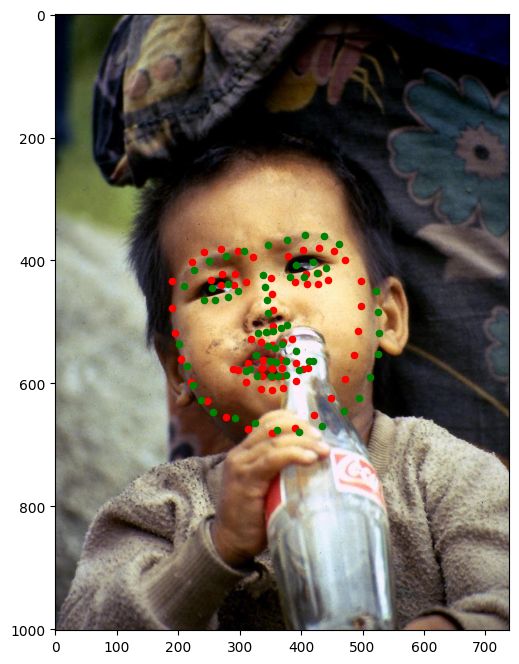

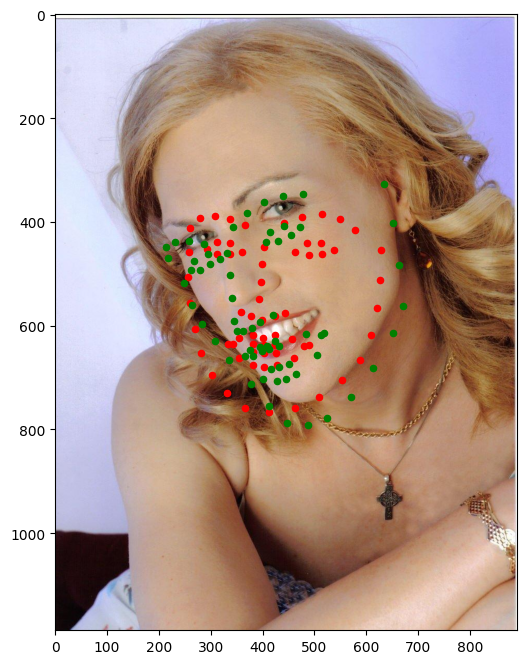

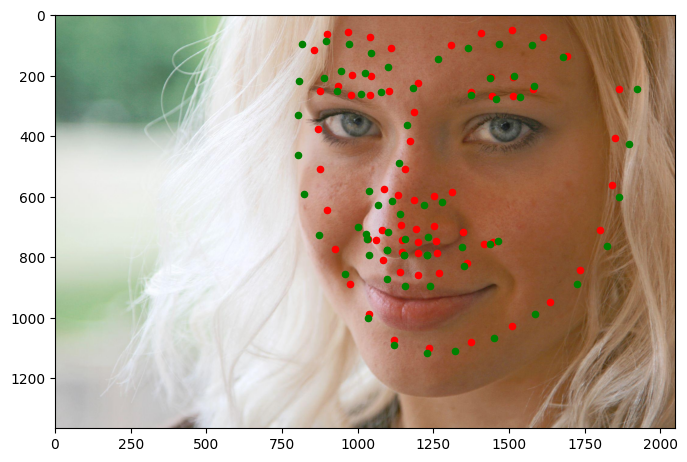

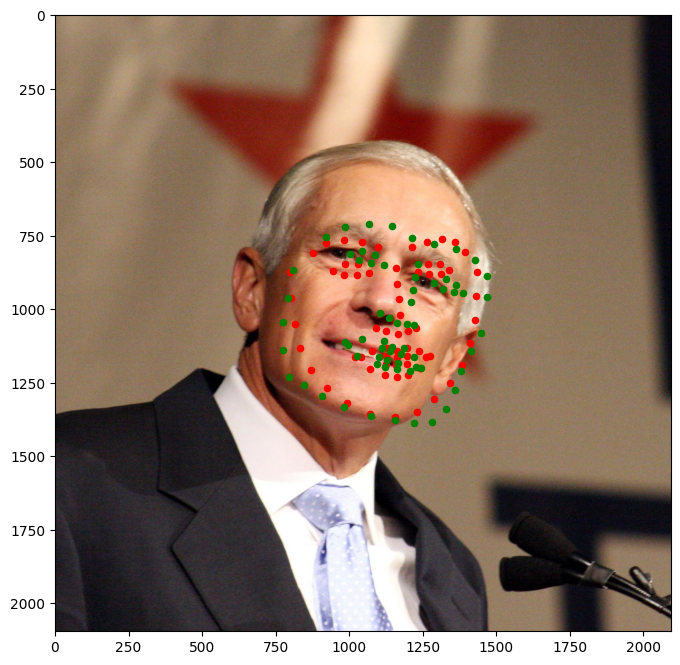

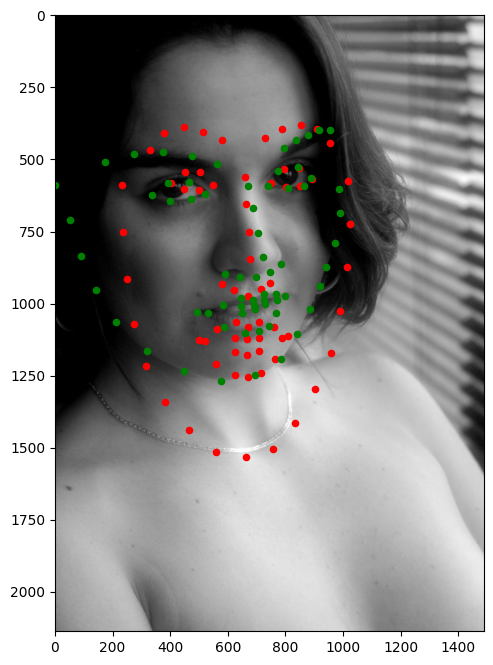

...

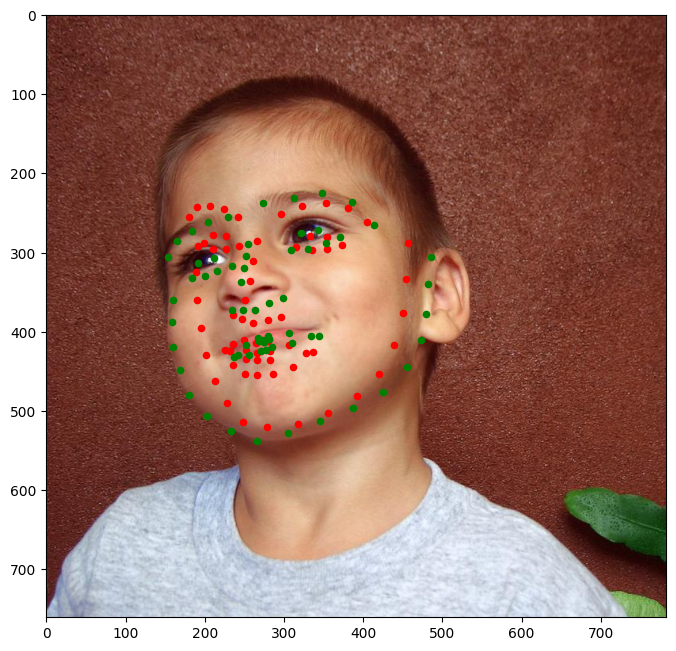

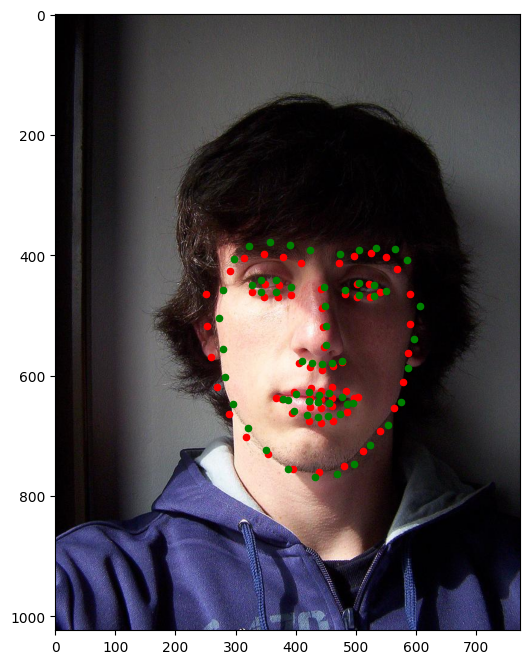

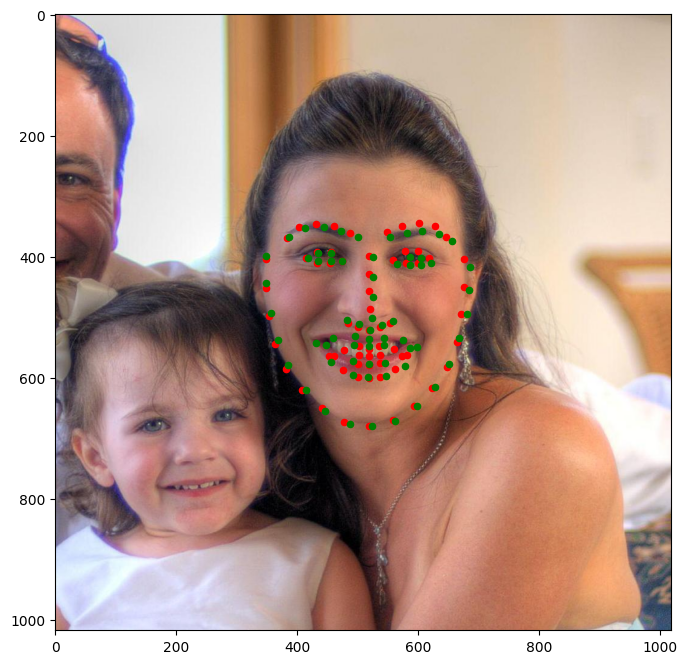

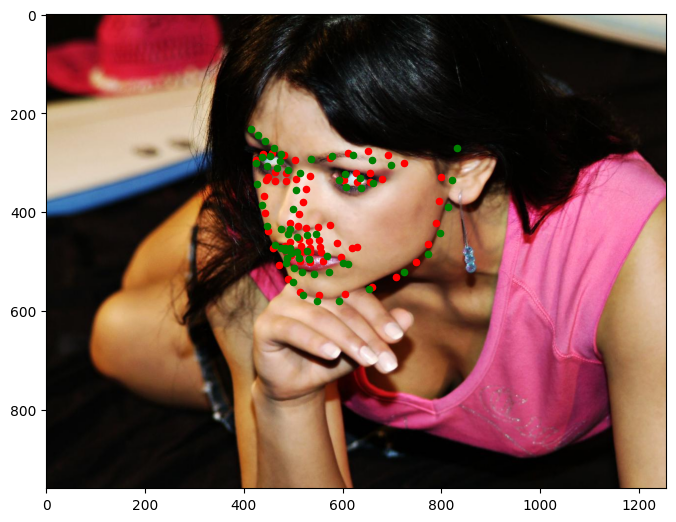

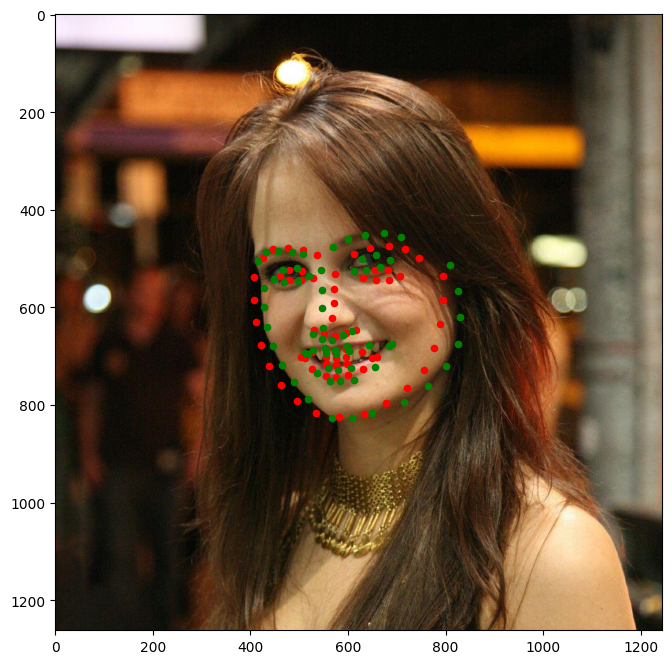

In [4]:
import matplotlib.pyplot as plt
from PIL import Image
for img_path, pred_landmarks, gt_landmarks in zip(img_paths, preds, gt):
    plt.figure(figsize=(8, 8))
    plt.imshow(Image.open(img_path))
    
    for (x, y) in pred_landmarks:
        plt.scatter(x, y, c='red', s=20)

    for (x, y) in gt_landmarks:
        plt.scatter(x, y, c='green', s=20)
    
plt.show()

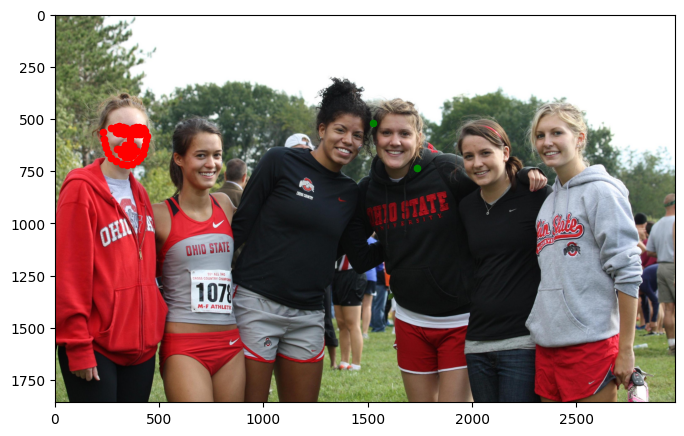

In [21]:
import matplotlib.pyplot as plt
from PIL import Image

files = [('data\\300W\\train\\5106695994_2.jpg', 'data\\300W\\train\\5106695994_2.pts')]
image = Image.open(files[0][0])

landmarks = read_pts(files[0][1])

plt.figure(figsize=(8, 8))
for (x, y) in landmarks:
    plt.scatter(x, y, c='red', s=20)

detector = dlib.get_frontal_face_detector()
faces = detector(np.array(image))
if len(faces) == 0:
    h, w = image.shape[:2]
    rect = dlib.rectangle(0, 0, w, h)
rect = faces[0]

plt.scatter(rect.left(), rect.top(), c='green', s=20)
plt.scatter(rect.right(), rect.bottom(), c='green', s=20)

plt.imshow(image)

In [23]:
import cv2
import numpy as np
import dlib
import os
from glob import glob
from tqdm import tqdm

# Define your dataset directories (adjust as needed)
# For example, assuming config.TRAIN_FOLDERS is a list of Path objects
# If using your earlier files, you could also iterate over that list.
# Here, we'll assume 'files' is defined as a list of tuples (image_path, pts_path)
from pathlib import Path

# If you already have a get_files() function defined, you can use it.
# For this example, let's assume dataset folders are stored in a list.
dataset_folders = [Path('data/300W/train'), Path('data/300W/test'), Path('data/Menpo/train'), Path('data/Menpo/test')]  # adjust this path accordingly
files = []
for folder in dataset_folders:
    for ext in ["*.jpg", "*.png"]:
        for img_path in folder.glob(ext):
            pts_path = img_path.with_suffix(".pts")
            if pts_path.exists():
                files.append((img_path, pts_path))

# Helper function to read keypoints from .pts file
def read_pts(file_path):
    with open(file_path, 'r') as f:
        lines = f.readlines()
    
    landmarks = []
    # Skip header lines (first three) and the last line
    for line in lines[3:-1]:
        x, y = map(float, line.strip().split())
        landmarks.append([x, y])
    
    return np.array(landmarks)

# Helper function to compute IoU between two bounding boxes
def compute_iou(boxA, boxB):
    # boxA and boxB should be in the format (x_min, y_min, x_max, y_max)
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
    
    # Compute the area of intersection rectangle
    interW = max(0, xB - xA)
    interH = max(0, yB - yA)
    interArea = interW * interH
    
    # Compute the area of both rectangles
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])
    
    # Compute the union area
    unionArea = boxAArea + boxBArea - interArea
    
    # Avoid division by zero
    if unionArea == 0:
        return 0.0
    return interArea / unionArea

# Instantiate dlib's face detector
detector = dlib.get_frontal_face_detector()

# Lists to hold size information
widths = []
heights = []
areas = []

# Counter for images with IoU == 0
iou_zero_count = 0
total_images = 0

for img_path, pts_path in tqdm(files):
    # Load image
    image = cv2.imread(str(img_path))
    if image is None:
        continue  # skip if image could not be read

    h, w = image.shape[:2]
    widths.append(w)
    heights.append(h)
    areas.append(w * h)
    total_images += 1

    # Get the face rectangle using dlib
    faces = detector(image)
    if len(faces) > 0:
        # Use the first detected face
        face_rect = faces[0]
    else:
        # If no face is detected, use the full image as fallback
        face_rect = dlib.rectangle(0, 0, w, h)
    
    # dlib rectangle coordinates
    face_box = (face_rect.left(), face_rect.top(), face_rect.right(), face_rect.bottom())
    
    # Read the keypoints from the .pts file
    landmarks = read_pts(str(pts_path))
    if landmarks.size == 0:
        continue  # Skip if no landmarks were found

    # Compute the bounding box of keypoints
    kp_x_min = np.min(landmarks[:, 0])
    kp_y_min = np.min(landmarks[:, 1])
    kp_x_max = np.max(landmarks[:, 0])
    kp_y_max = np.max(landmarks[:, 1])
    keypoints_box = (kp_x_min, kp_y_min, kp_x_max, kp_y_max)

    # Compute IoU between face_box and keypoints_box
    iou = compute_iou(face_box, keypoints_box)
    if iou == 0.0:
        iou_zero_count += 1

# Calculate min, mean, and max sizes
min_width = np.min(widths) if widths else None
mean_width = np.mean(widths) if widths else None
max_width = np.max(widths) if widths else None

min_height = np.min(heights) if heights else None
mean_height = np.mean(heights) if heights else None
max_height = np.max(heights) if heights else None

min_area = np.min(areas) if areas else None
mean_area = np.mean(areas) if areas else None
max_area = np.max(areas) if areas else None

print("Image Widths - Min: {:.2f}, Mean: {:.2f}, Max: {:.2f}".format(min_width, mean_width, max_width))
print("Image Heights - Min: {:.2f}, Mean: {:.2f}, Max: {:.2f}".format(min_height, mean_height, max_height))
print("Image Areas - Min: {:.2f}, Mean: {:.2f}, Max: {:.2f}".format(min_area, mean_area, max_area))
print("Total images processed:", total_images)
print("Number of images with IoU == 0 between keypoints and face rectangle:", iou_zero_count)

100%|██████████| 12652/12652 [23:06<00:00,  9.13it/s] 

Image Widths - Min: 58.00, Mean: 723.03, Max: 4773.00
Image Heights - Min: 58.00, Mean: 701.69, Max: 5400.00
Image Areas - Min: 3364.00, Mean: 959958.92, Max: 22918137.00
Total images processed: 12652
Number of images with IoU == 0 between keypoints and face rectangle: 316
